Notes from lectures and questions to them. Summer 2022

Course:

    EECS 498-007 / 598-005
    Deep Learning for Computer Vision
    Fall 2019 

https://web.eecs.umich.edu/~justincj/teaching/eecs498/FA2019/schedule.html

## Lecture 5. NN

6. Problem with Linear Classifiers? Only linear. Can't recognize diff modes (horse looking in diff directions).

7. Solution might be feature transforms. So from original space to feature space. Example is a polar coordinates can represent features in a circled area. So choosing smartly to feature transformation might be more meaningful. 
    
    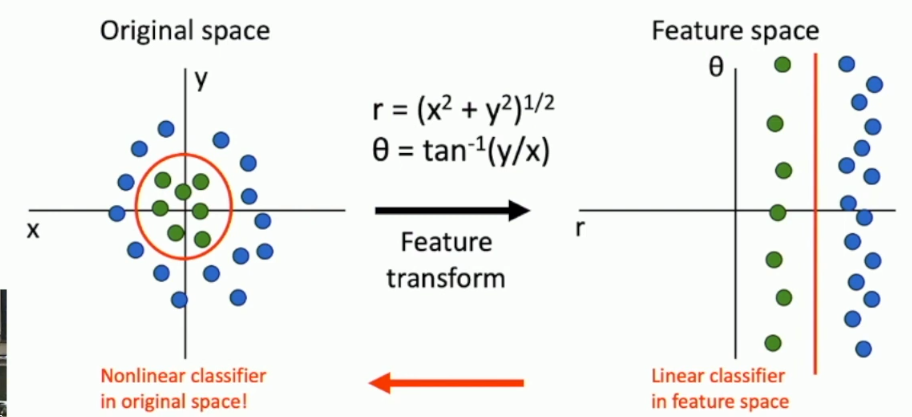
    
    - Another feature transform example - color histogram. This represents types of colors presented, e.g. N green, M blue color value, etc.
    - Another: Histogram of Oriented Gradients (HoG). Computes edge directions for little squares.
    - Another: Bag of Words. Step 1: build codebook (little patches extracted from image). Step 2: encode images using thos batches. And use those as features. 
    - Another: use previous features representation combined. 
    
    This was very widely used around 2010. 
    
    But it is complicated where only the last part of this large system learns. So the deep NN learns from the firsthand data without feature extraction. So NN learns how to extract features and learns on them.
    
22. NN. 

(Before) Linear score function: $ f=W x $

(Now) 2-layer NN: 

$ f = W_2 max(0, W_1 x) $.

So it is functions combination. Generalizable to 3-layer. 

We can visualize it as using lines as at the picture below that goes through rectangles. Then each element projection is denoted as (i, j) which means j-th element from source projected to i-th element in target.

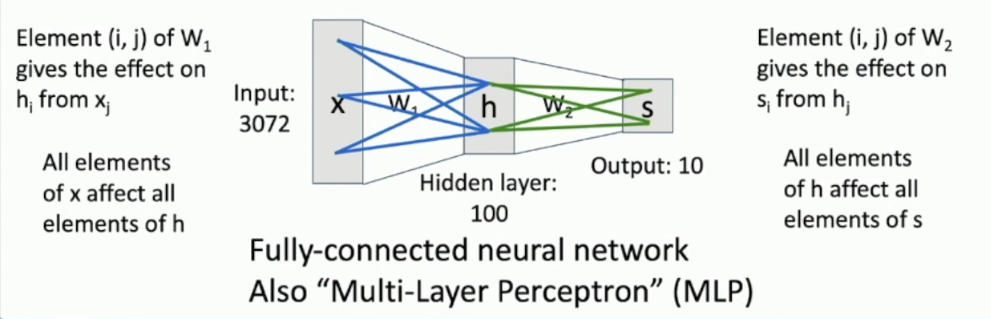
    
This is fully connected as all elements effect all other.

How we can interpret those weights in layers? Unclear, but there is some structure. Below is an image that shows that there is two diff templates for left-headed horse and right-headed horse. But most of the time it is not interpretable. 

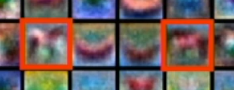

Is redudencies possible? Yes but can fix.

32. Deep NN. 

Depth - num of layers. 
Width - size of a layer.

33. Activation Functions.

This is $ max(..) $ and other. 

$ ReLU(z) = max(0, z) $ - rectified (выпрямленный) linear unit.

Q: What if no activation function? 
A: It will be just a linear classifier. No additional power beyon linear classifier.

Various exist:

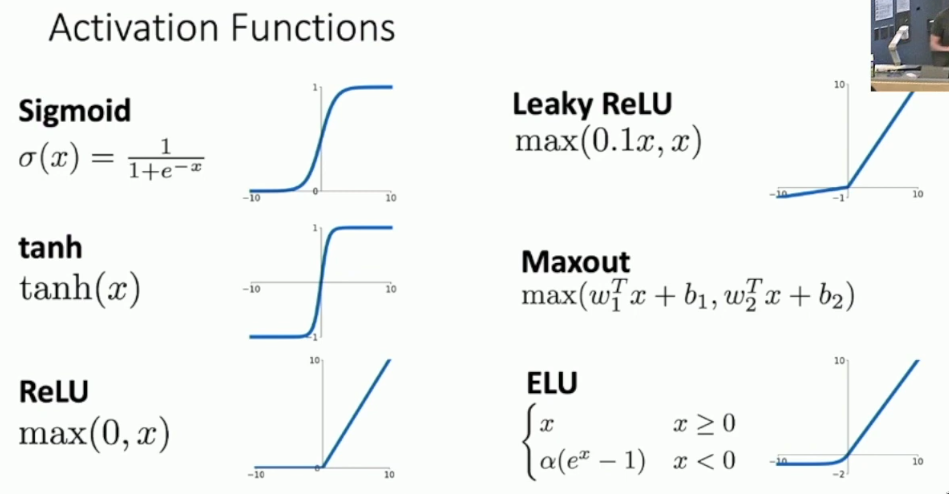

ReLU pretty good choice.

39. Simplest 1 hidden layer implementation example with numpy.

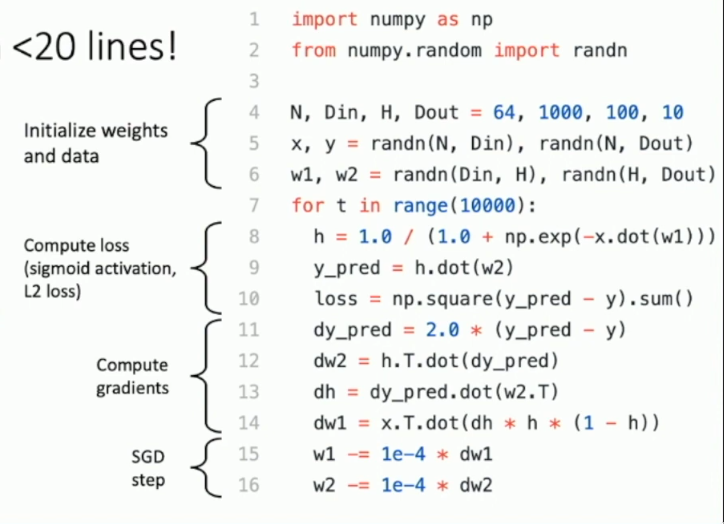

43. So what's neurons? Why this analogy?

Neuron:

- Cell body
- Axon - output
- Dendrite - input from other axon
- Synapse - connection between dendrites and axons. 
- Firing rate is at what point it fires outside when received an input rates. This is similar to artificial neurons. This is where simularity ends! 

There are many differences:

- can loop back to itself, they have very complex connectivity (topology). But artificial NN is in layers which is an abstraction.  There are research on complex topologies of NN. 
- Bio neurons are diff types
- Can perform non-linear computations
- Synapses are not single weight.
- Rate code might not be received.

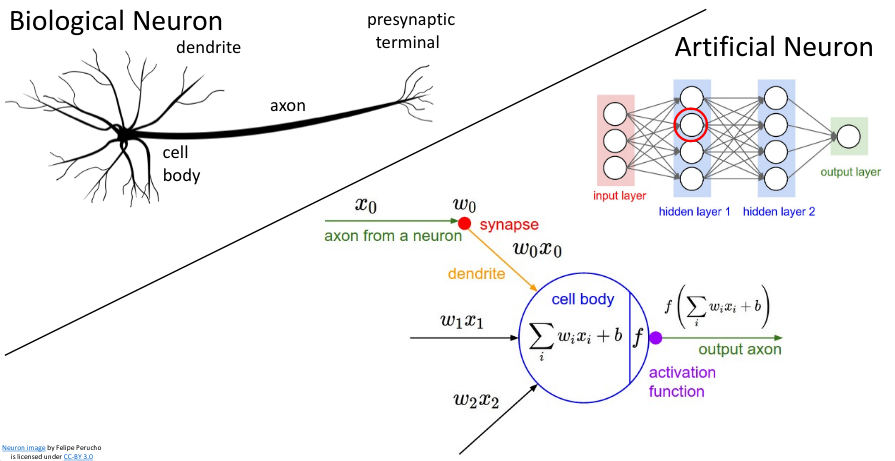

52. Space Warping.

Why NN so powerfull? Space warping. So for two classifies it can be viewed as it tranforms input into another 2-dimensional space:

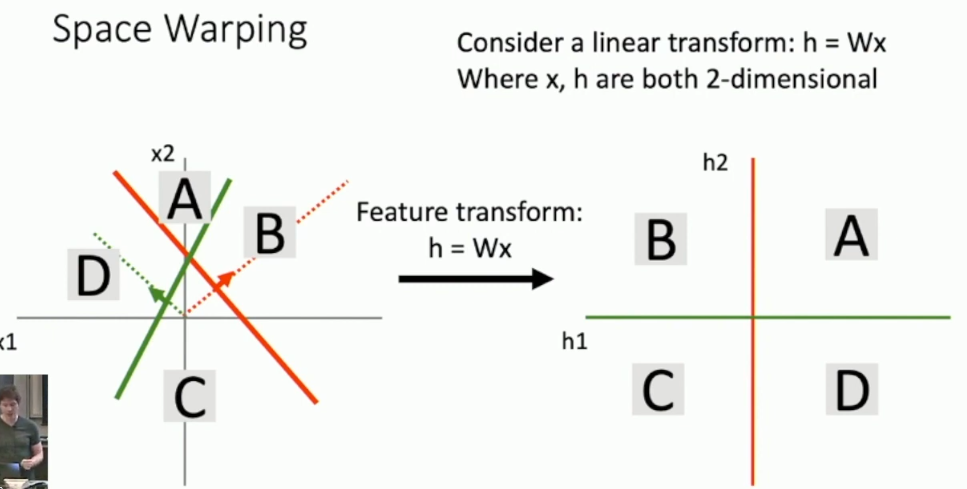

And so after one this transformation ( $ h = W x $) it only moves ones our features. And when we add activation function, eg. ReLU. It moves features to positive space via projecting them on positive parts of axes:

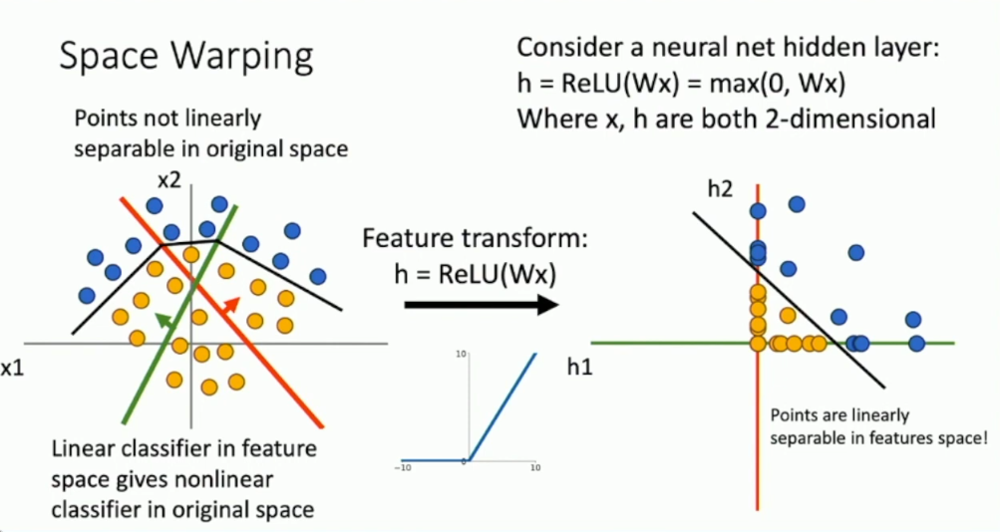

And it can be now linearly separated!

More complex for more dimensions. But we can increase num of hidden units so that it can find more complex patterns. 

So NN can be seen as transformers of the feature space. And they can represent very complex functions.

68. Universal Approximation.

A NN with 1 hidden can approximate any func, $ f: R^n \to R^n $ with arbitrary precision.

Intuition behind this U.A. theorem is that weights form many 'bumps' (шишки) that can be tuned such that it approximates any function.  

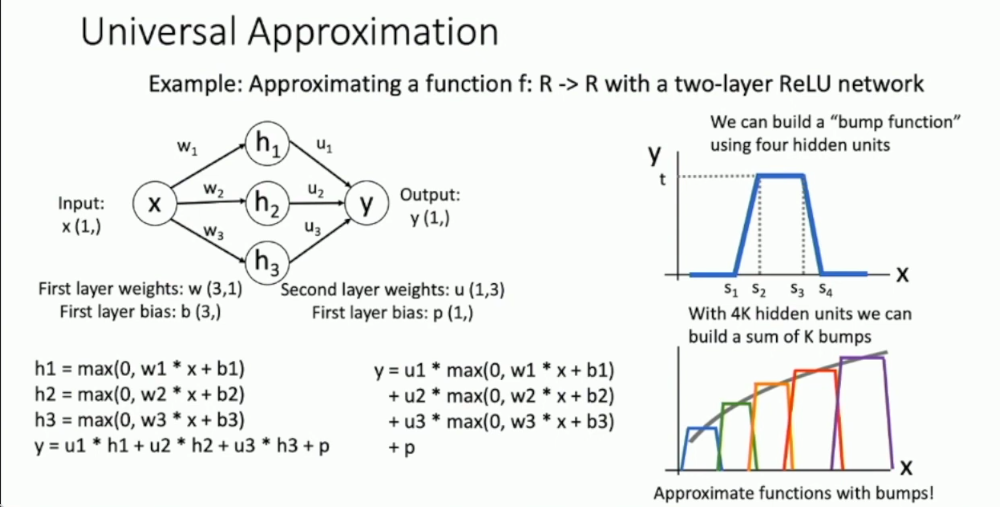

But what about gaps? other non-linearities? higher-dim? See Deep Learning book. (Nielsen, Ch 4)

This U.A. th. prooves in theory that it is possible. But in reallity it doesn't learn bumps. It doesn't guarantee that we will find such weights, or how much data. So it doesn't proove that NN is the best, silver bullet. Why? Remmber kNN is also a uni. approximator but very silly. 

How can we know that NN will converge?

85. Convergence. Convex functions.

Func is convex if $ \forall x_1, x_2 \in X, t \in [0, 1] : f(t x_1 + (1-t) x_2) \le t f(x_1) + (1-t) f(x_2) $ . Meaning a line connecting those two points always lies above.

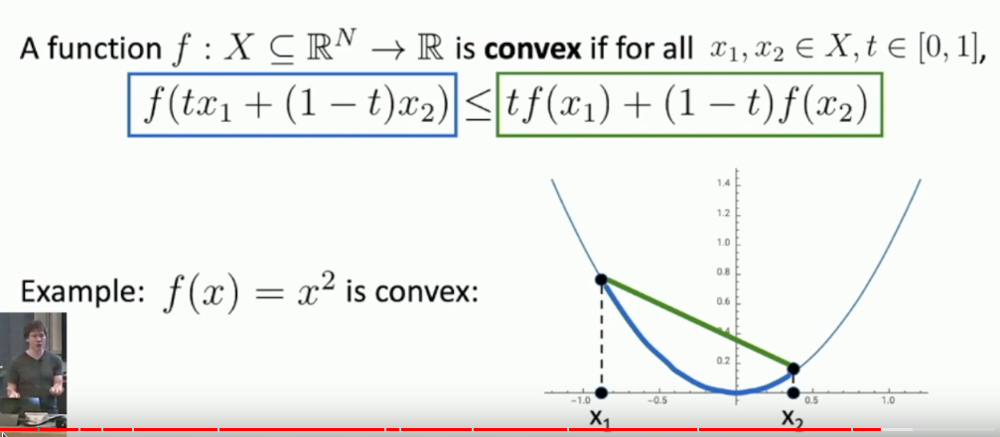

Contrast with $\cos()$ or $ \sin() $ funcs

They 1) easy to optimize; 2) converge to global min.

- 92. Linear classifiers optimization problems are a convex functions.

But no such guarantee for NN. Sometime they look like they convex but othertime they not:

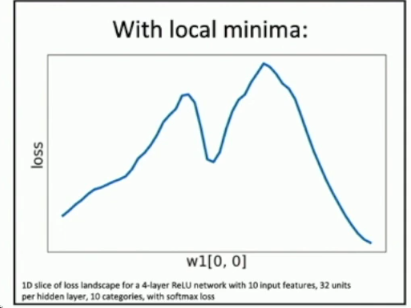

Most NN rely on nonconvex optimization. In practice it works (strange). Active area of research. 


102. How to compute gradients? Backpropogation.

### Questions

6. What's problem with linear classifiers?
7. Feature transformation. What's it? Name diff feature transformations.
8. NN. Basic form for 2 layers? With more layers? 

- What's in representation of NN an element (i, j) means in terms of source and target.
- How can we interpret those weights in NN?
- What's depth in deep NN? What's width?

33. Activation Functions. 
- What's it?
- ReLU func?
- Name other activation functions.

43. Neurons.
- Name main parts. What are they?
- Name differences with artificial neurons

52. Space warping.
- What's it? What's those $h$ represent?
- What happens with this wraping when we add activation func?
- What's NN then? 

68. Universal Approximation.
- Formulate the theorm.
- What's the intuition behind this? 'Bumps'?
- So any NN will work in practice? 

85. Convergence. 
- What's convex function? Formulate condition.
- Is Linear classifier a convex func?
- Is NN a convex func? What happens in practice?

## Lecture 6. Backpropagation


5. How to compute gradients? If we compute grad we can optimize the loss func. How for arbitrarity weights.

6. Naive. Derive gradient on paper. Idea is to write the derivative and then insert values. 
- Why this is bad?
    - Tedious. Long to write.
    - Not feasible for complex models. E.e. softmax.
    - Not modular design. If we have done for sigmoid loss but today want ReLU? Re-write then. So we want modular approach. 
    
Better idea is using computational graphs.

7. Computations graph.

Units are functions or variables that are combined with arithmentic operations. See picture:

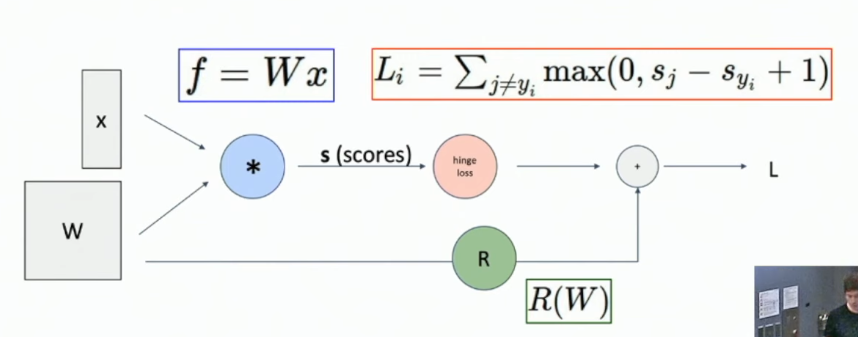

Seems trivial but if we take large deep nets then it's better to use those large graphs. Can be large! Consider Neural Turing Machine. And this can be even more complex when nets are recurrent. 

11. Example of how comp graph helps compute gradients.

- First step: Forward pass. 
- Second: Backward pass. Compute derivatives.

Question: what's derivative for $ f(x, y, z) = (x + y) z $ . Using backprog

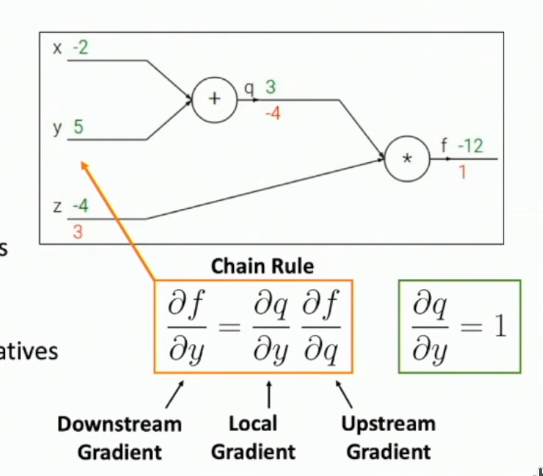

Terms:

- Downstream grad
- Local grad
- Upstream grad

Why good? Modular. Each piece doesn't need to know about other pieces. So a module (arithm operation) will have input and output. And derivative is calculated backward way. This is because of chain rule.

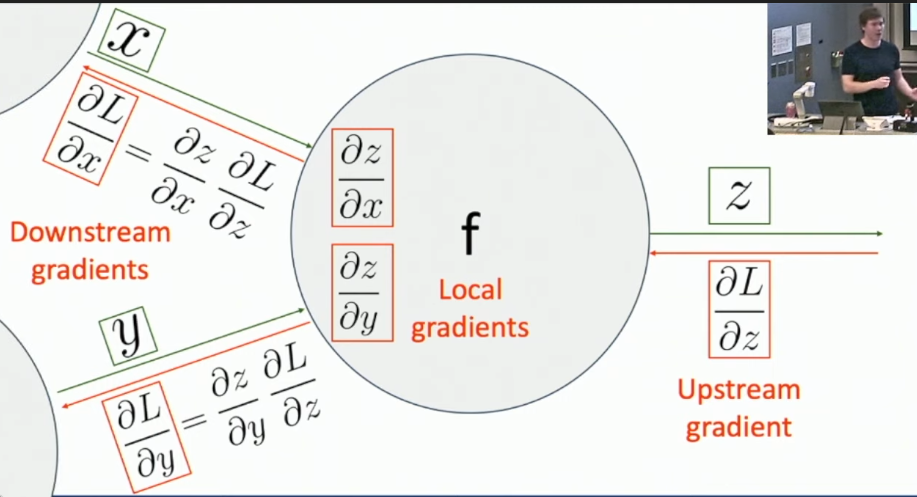

Adding arbitrary modules. So it breaks down into basic primitives. So let's define our functions to have shorter graph. E.g. let's add Sgimoid function. This is when one input and one output. 

46. Patterns in Gradient Flow.

- _add_ gate: gradient distributor. Two inputs and one output.
- _copy_ gate: gradient adder. One input, two outputes. Eg. when we want to use two copies: for regularization and for loss. 
- _multiplication_ gate: "swap multiplier". 
- _max_ gate: "router". Routes downstream only to the max flow and 0 to another.

50. How to implement in code?

"Flat" gradient code:

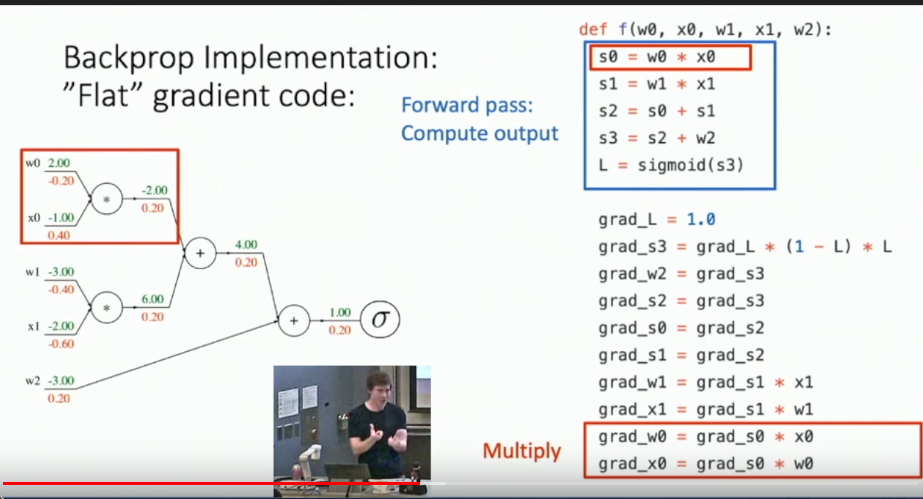

60. There is API for computing backprop. 

In PyTorch - autograd functions. It has a class for each operation that has `forward` and `backward`. 

67. What about vector-valued func?

1 varaible - Derivative.
n vector - Gradient.
n times m - Jacobian. 

The same picture for backprop with Vectors: downstream, upstream, etc.

75. Backprop with Vectors.

For $ max(0, x) $. Jacobian matrix is diagonal then. So never form explicit form of Jacobian. 

82. Backprop with Matrices (Tensor)

Upstream grad is matrix. 
Donwstream is matrix, tensors.

86. How to strategy to ease computations.

How to implement this? Strategy to ease it. It is hard because matrices are big. Consider 256GB for each matrix. And biggest GPU on market has less memory. How to compute without explicitely?

Think about one element and compute slices:

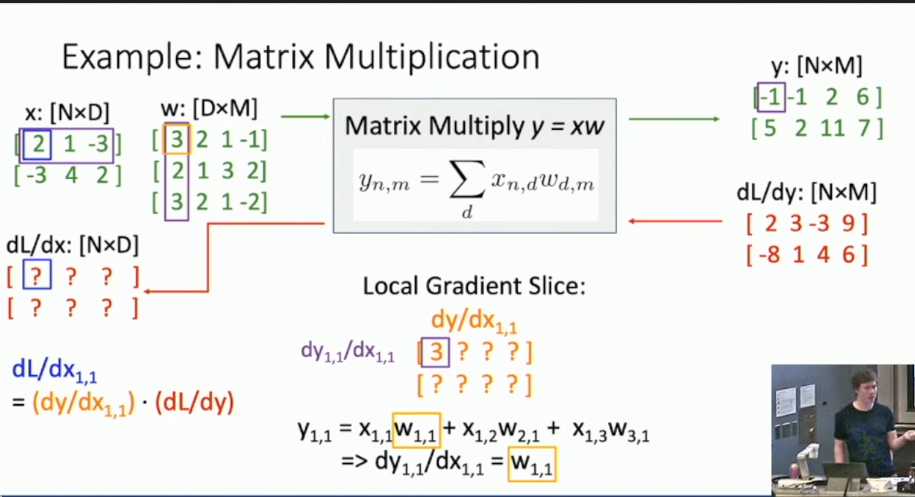

For example for multiplication this simplified into:

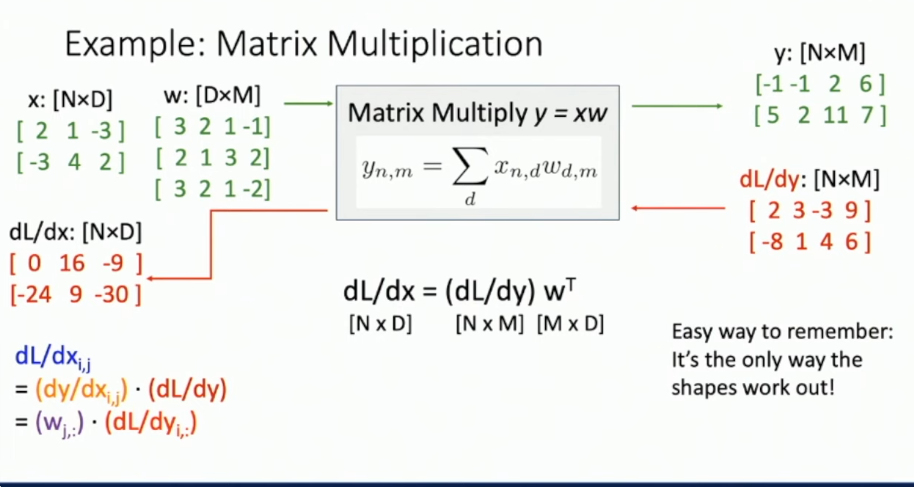

108. Another view on backprog

It's long chain of functions:

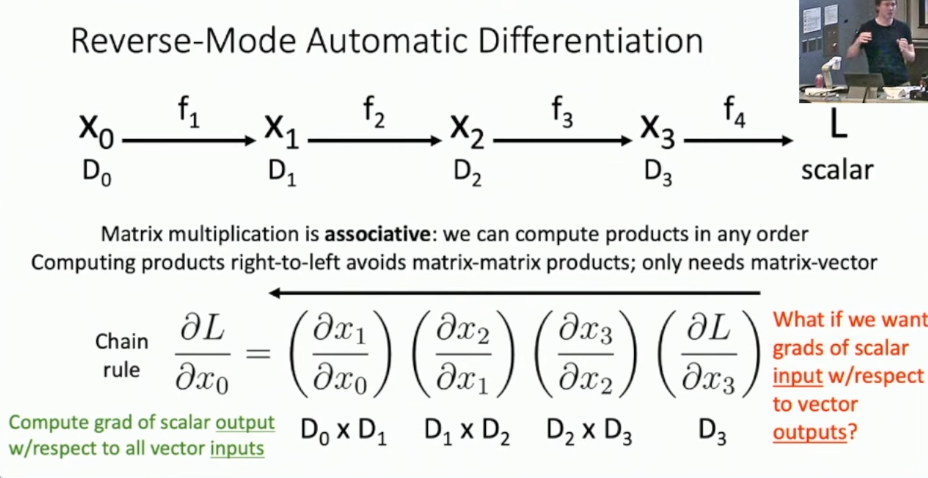

There is Forward-Mode Automatic Differentiation which is for diff w.r.t. a scalar. This not used in ML but might be useful elsewhere (physical simulations).

115. Higher-Order Derivatives.

The same backprop used. Hessian matrix - second-order. 
Tricks for multiplying Hessian by vector.
This is based on first-order derivatives. So we can compute higher-order derivaties. It is implemenhted in PyTorch/TensorFlow. 

122. Summary

So we have linear classifier, NN, backprop. But it doesn't respect the spatial structure of images. So let's go to Convolutional NN. 

Questions:

5. Why computing gradient 'on paper' and then using it in code is bad?
7. What is an alternative? Computational graph?
11. Backprop
- Show how to do backprop on $ f(x, y, z) = (x + y) z $. Where x=-2, y=5, z=-4.
- What's downstream/local/upstream gradients?
- Why it is good?
60. How is it implemented in PyTorch?
67. How to backprop with vector-valued functions?
75. With vector. If with vector, what type is Jacobian matrix then? 
85. With matrices. What's Jacobian matrix? 
- Computational problem with Jacobian matrices. How to simplify computation?
108. Another view on backprop? Chain of functions. 
115. Is it possible to compute higher-order derivatives with Pytorch/TensorFlow?
122. Why do we need Convolutional NN now when we have loss func, backprop, linear classifier, etc.? What do we lack now?


## Lecture 7: Convolutional NN

4. Recap. Backprop. Forward pass, backward pass, etc.

5. Problem now is that none of those classifiers (linear or NN) respect spatial structure. But it is very usefull to take into account spacial structure. 
- Solution? Define new operators (computational nodes) that operate one spatial input.

7. Components of a Con. Network.
- Fully-Connected Layers
- Convolutional Layers
- Activation Function 
- Pooling Layers
- Normalization

9. Convolution Layers

- It moves from Fully-Connected Layer. To recap: Fully Conn. layer takes flatten layer. And we multiply with $W$. 
- Now, Con. Layer preserve spatial structure. E.g. 3x32x32 image. 3 - depth or channel. 32x32 width and height. 
- Weight matrix now have also 3D structure. Now it is 'filter'. E.g. 3x5x5. 
- We will slide a filter to compute another 3D output.
- Filter depth should always match the depth of image. 

15. Computing. 

- Example. 3x32x32 image. 3x5x5 image. 
- Ouput of dot product is 1 number. This tells how this position on image matches with the filter. See image below:

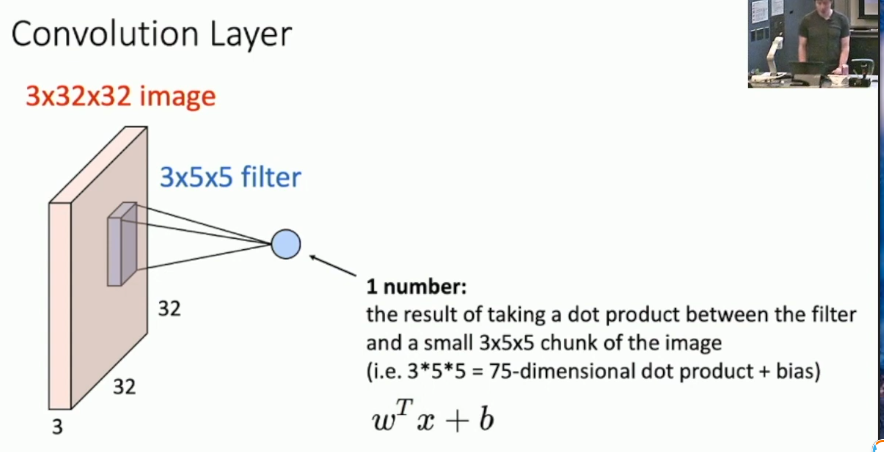

- After sliding over all spatial locations we get 'activation map': 1x28x28.
- We can do 2 more filters to consider all channels. RGB. Repeat two more times. 
- We can do more filters. Example below with 6 filters. And then we can stack 6 activation maps with each 1x28x28 to get into 6x28x28 output image. 

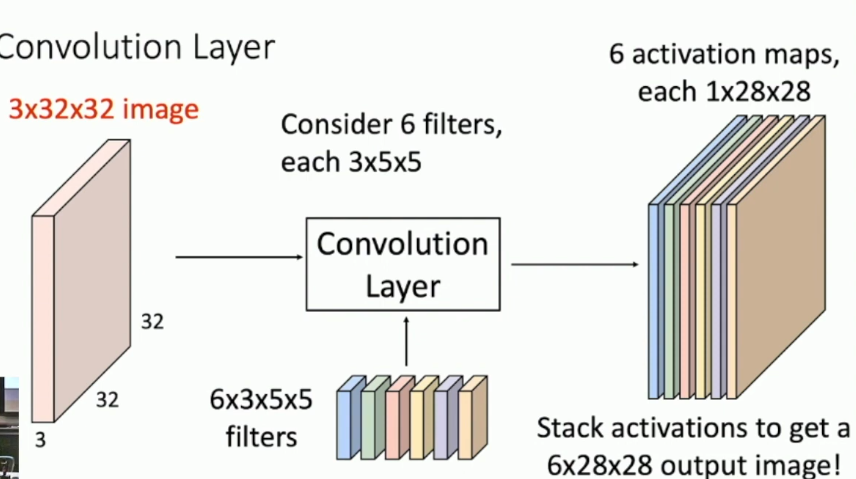

- Conv. layer always 6 dim bias vector. 
- What's output? Intuition. 
    1. A map that is output of a filter is how the image respond to this filter.
    2. A grid of feature vectors. Now take those layers together as a feature grid.

21. On batch of images. 

We can extend it to a batch of images. Each image gets its output. That is for N images it outputs N. 

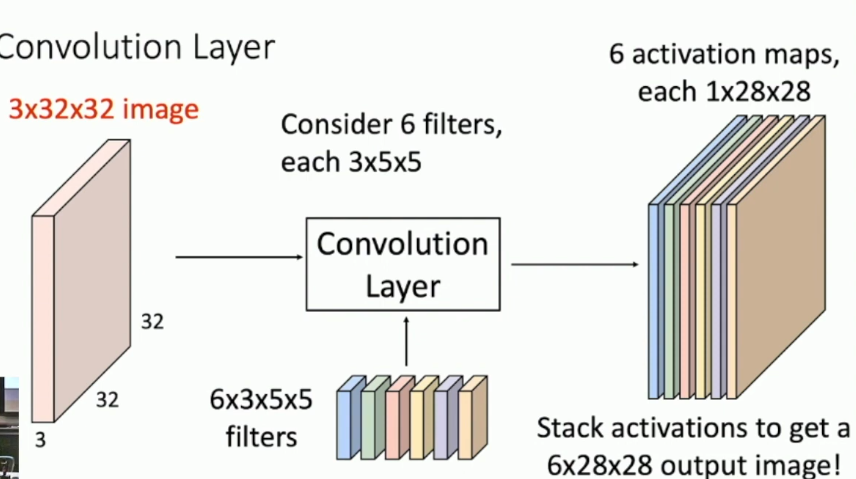

23. Stacking Convolutions. 

- Let's stack it and that way we get the layers of convolutions. 

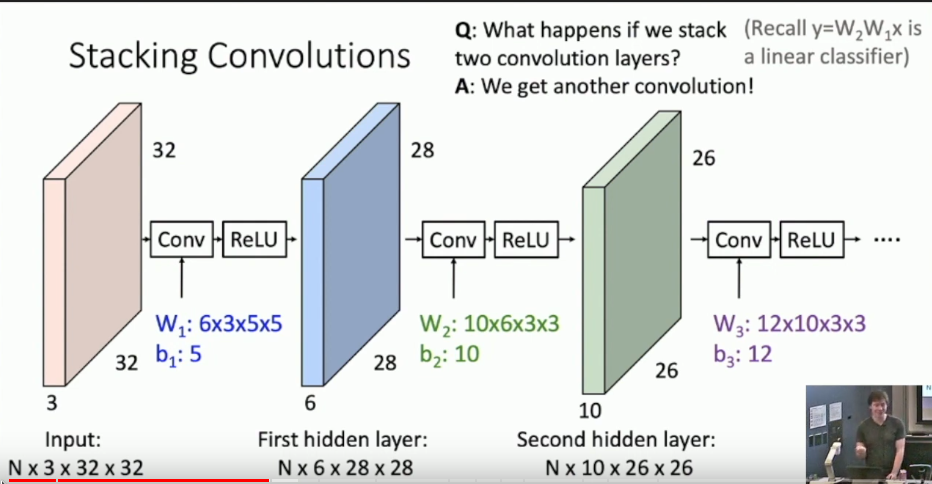

- Hidden layers is the same as before but now those are convolutions.
- What if we stack conv on another conv? We get third conv. So lets instert non linear activation function, let's add 'ReLU'. 

27. Interpreting layers. 

- We can visualize it the same way as before. Just view them as images. 

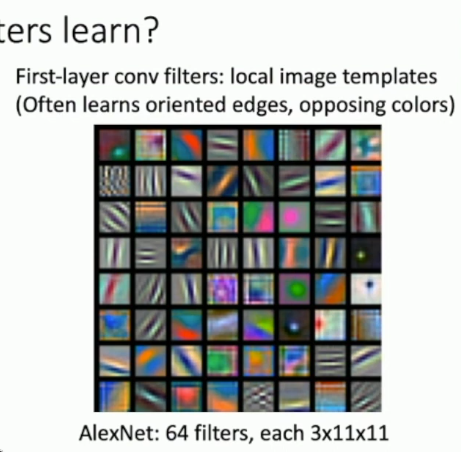

They might learn edges, frequences, opposing colors. 

30. Closer look at spatial dimensions.

- Input 7x7. Filter 3x3. Output: 5x5. So output: W - K + 1, where W -input, K - filter (kernel size). 
- Problem: it shrinks each layer.
- To fix we introduce, padding: add zeros around the input. So add $P = (K - 1) / 2$. 
- Receptive Field - is what a single element in output depends on.
- When several layers? Receptive fields are bigger. 

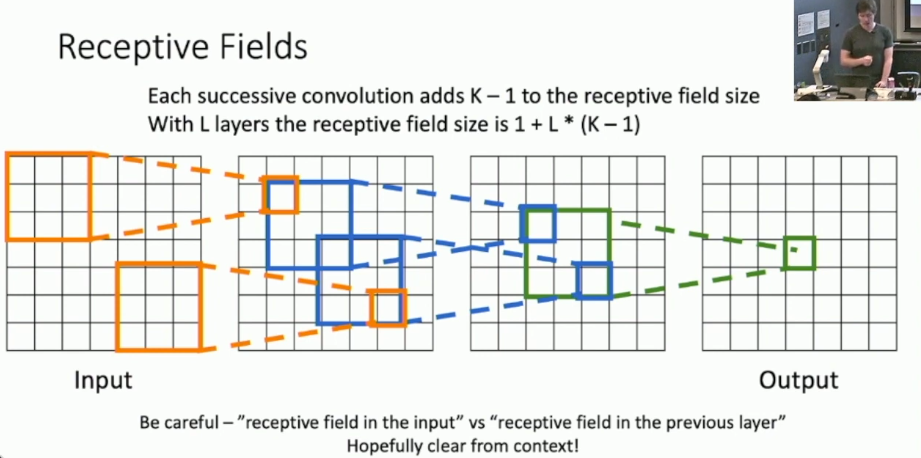

- Possible mix of terms: "receptive field in the input (image)" vs "in previous layer". The size is different.
- Problem: So how many layers we need for one unit to see whole image? Many layers then. Depends on the size.
    - Solution: Let's add another hyperparam. 'Stride' (шаг). Let's step not at every other but at every two or more (stride). Then it builds output quicker. Then it is $ (W - K + 2 P) / (S + 1)$ where W - input, K - filter, P - padding, S - stride.

- Question:

    Input volume: 3 x 32 x 32
    10 5x5 filters with stride 1, pad 2
    Output volume size:
    (32+2*2-5)/1+1 = 32 spatially, so
    10 x 32 x 32

53. 1x1 convolution layer. 

55. Recap. Convolution summary

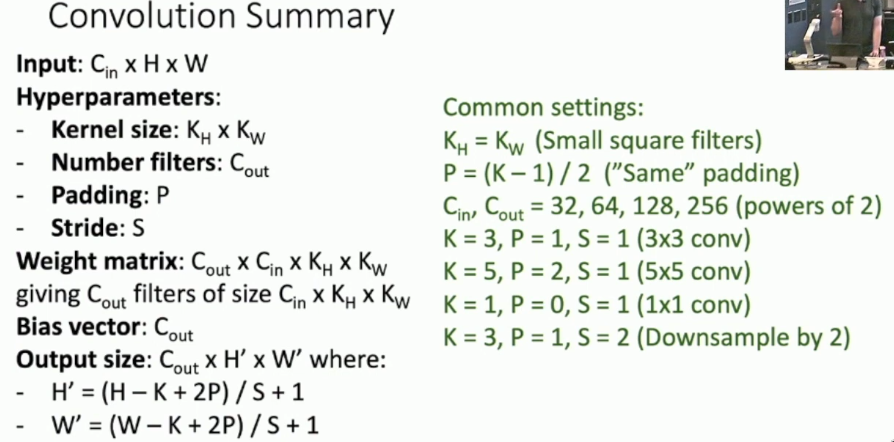

57. Types of convolutions

- 2D Convolutions. $C_{out} x C_{in} K x K $ shape.
- 1D Convolution. For text or audio. It is $ C_{out} x C_{in} x K $ shape.
- 3D Convolution. $ K x K x K $ shape. 

60. PyTorch Conv Layer

- `torch.nn.Conv2D`, `Conv1D`, `Conv3D`

63. Pooling layers (pool - объединять)

- Downsample or collapse without weights. It reduces shape (not rank). So for a particular set of values it reduces into one then repeats.
- Max Pooling. Stride and kernel size are the same. Max pooling is getting the max from those set of values. 

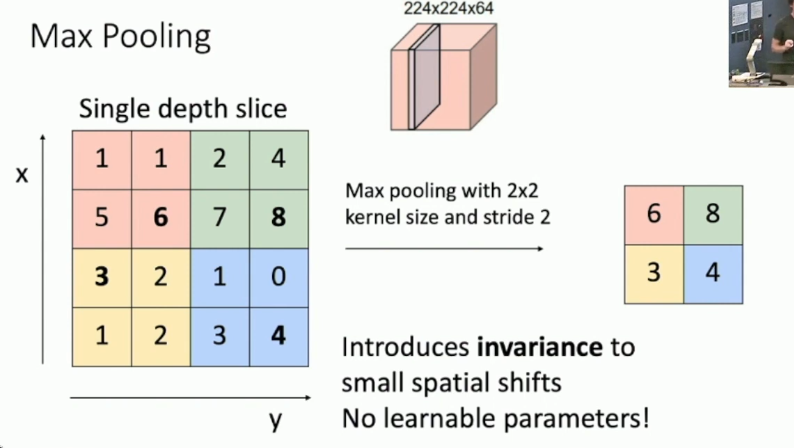

Why pooling? No weights. It introduces invariance, i.e max didn't change (somewhere useful).

Another is Avg Pooling. That is useing an average value for the set.

67. Architectures of ConvNets.

Many exist. Classic one is LeNet-5

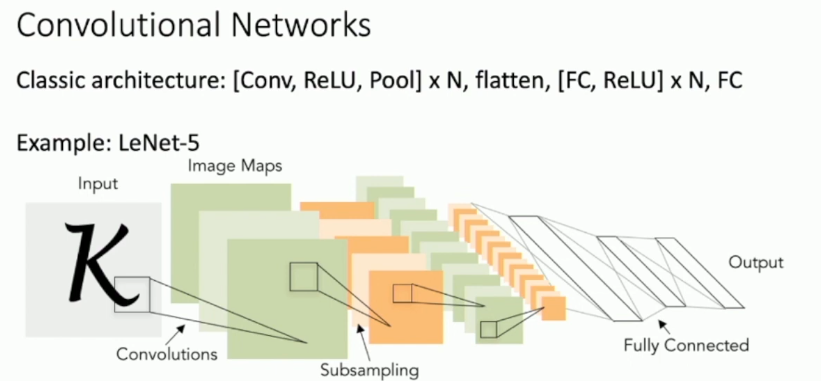

68. LeNet-5

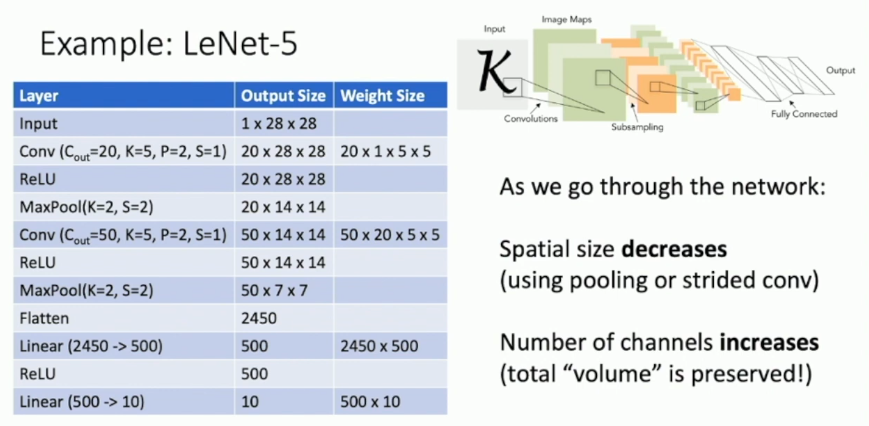

Total volume preserved with spatial size decreases but num of channels of increases.

77. Problem: Hard to train!

It's difficult to converge this NN. So let's add normalization.

79. Batch Normalization.

In Fully-Connected networks:

- Receive from prev layer, normalize it - zero mean and unit variance. 
- Why batch norm? "Internal covariate shift" improves optimization. See paper. In essence we want to avoid next layer to reflect prev layer noise (?). More stationary distribution. 
- It normalizes all layers, standardize them all:

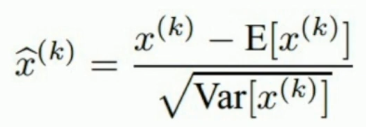

- So it will be another layer.

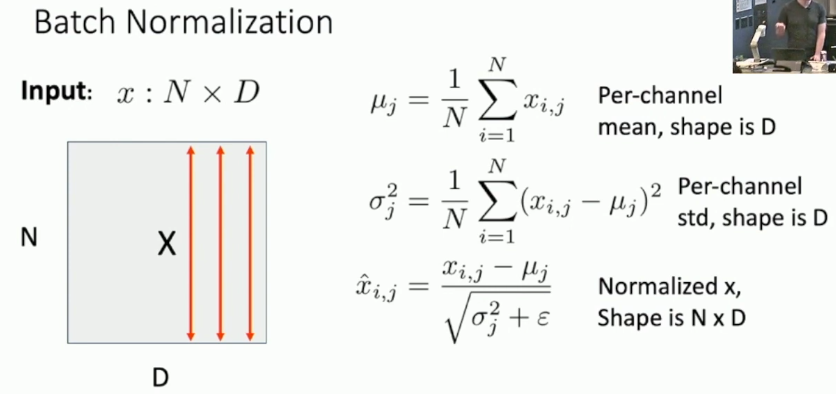

- Epsilon is to avoid div by zero.

- Problem is it might be hard constraint on NN when we make it zero mean. So let's do learnable scale and shift parameters: $ \gamma, \beta $. (TODO??)

- Problem: estimates depend on minibatch. (TODO?) For training it will keep running average mean / std. And at test time is different.

- 85. Batchnorm can be made a linear operator. So can be free at test-time. 

86. Batch norm In ConvNets.

Similar:

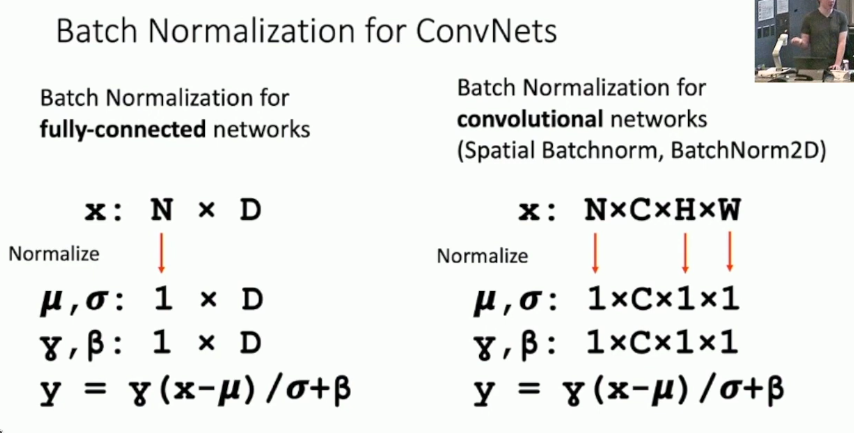

87. Batchnorm where to do?

Add after ConvNet layer or Fully-Connected layer. 

88. Batchnorm. Performance

Pros:

- Makes training must faster. So we can increase learning rate - this is robust finding.

Cons:

- Not clear why it helps. 
- Behaves differently during training and test time. Very common as source of bugs.

90. Layer Normlization. 

- To fix the issue with diff behavior at test and train time.
- Simular to Batch norm. It computes avg over D dimension (not over examples but over dimensions of those examples). Then be

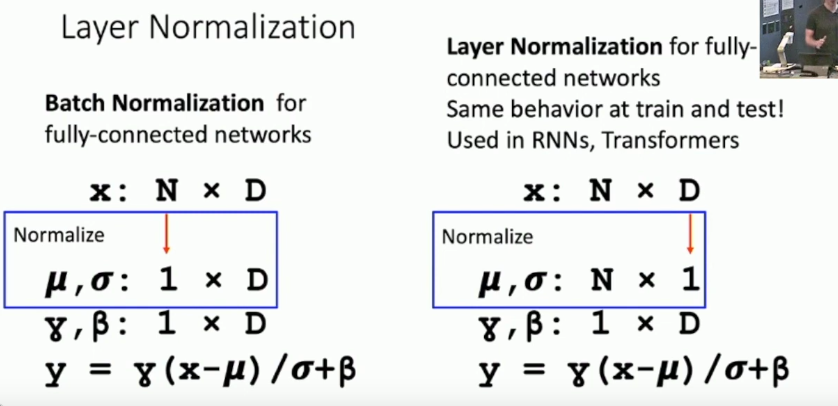

91. Instance Normalization

- Simular Layer Norm but now on diff dimensions:

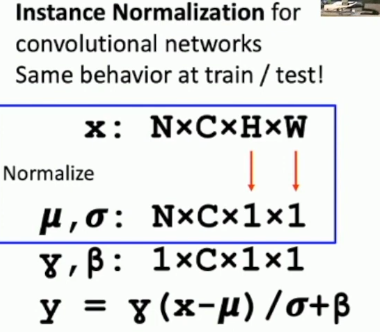

92. Comparision of normalization

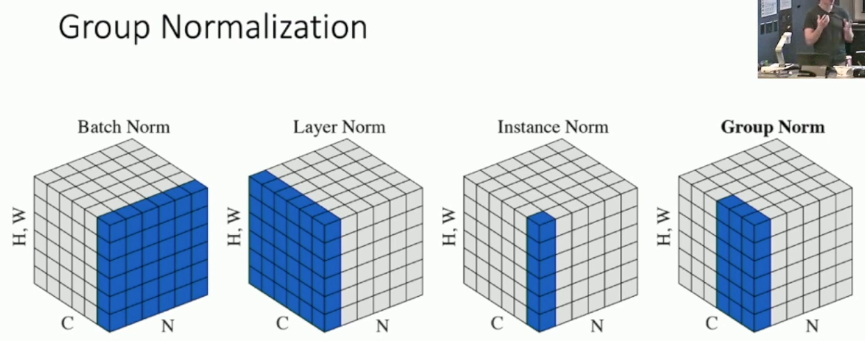

94. How to combine? This is a next lecture. 

### Questions:

5. What's problem with linear classifier and NN? What's solution?
7. Name components of Conv. NN.

Convolutional layer:

9. Conv. layers
- What's filter?
- How large can be filter? Its depth?
- What's value of a cell in output?
- How many filters there are typically?
- What's intuition behind the output? Two ways of thinking about output.
21. How do we do it on a batch of images.
23. How do we stack convolutions? What's the problem if we stack directly?
27. How can we visualize layers?
31. Example. How large output for this example: Input 7x7. Filter 3x3.
- What's the shrinkage? Is it problem? How to fix?
39. What's 'receptive field'?
- Why might we need many layers if we consider one item in output and its receptive field? Is it problem? Solution?
- What's stride? How output size now calculated?
47. Example. Calculate: 
    Input volume: 3 x 32 x 32
    10 3x5x5 filters with stride 1, pad 2
    Output volume size: ?
57. What types of convolutions there are? 

Pooling layer:

63. Pooling layer.
- What it does? Difference from convol. layer.
- Why pooling?
- What's Max Pooling? How implemented? 
- What's Avg Pooling?

67. Example of ConvNet: LeNet-5. How many convol. layers? What is the last layer?

Batch Normalization:

77. Problem with ConvNets
79. How normalization is done?
- Describe how to compute it.
- What's $ \gamma , \beta $ params?
- Can we make it into a linear operator?
- Performance of batch norm
90. Other types of normalization:
- Layer Normalization
- Instance Normalization
- Group Normalization

## Lecture 8. CNN Architectures

4. Last Time: Components of CNN: conv. layers, pooling layers, fully-connected layers, act func, normalization. 
- But how to combine? So let's see history

5. ImageNet Class. Challenges
- Error Rate benchmark.
- From 2010. At 2010, Lin et al - 28.2% with Shallow (linear class.)
- 2012 - AlexNet.

7. AlexNet
- 227x227. 5 Conv. layers. Max pool 3 fully connected layers. ReLU .
- Used "Local response norm". Not used now.
- Trained on _two_ GPUs. GTX k80 GPUs with 3GB of memory each.
- In the picture (see below) we see it is split into two GPUs.

- AlexNet was very cited: 46.5 K citations! Compare with Darwin - 50K citations. Shannon - 69K. So it is not good metric. So AlexNet looks like a historica mark in human knowledge.

- 12. Structure of AlexNet

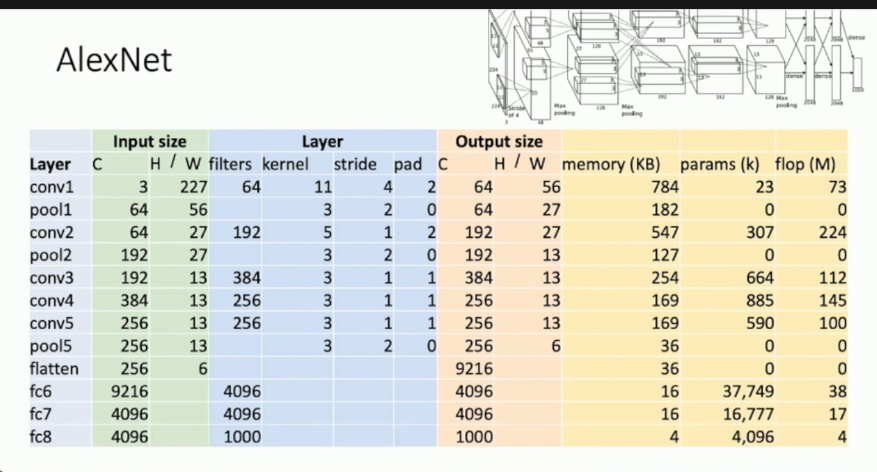

- How it was designed? Trial and error. 
- But if we check memory, params, flop then:
    - Most memory usage and FLOP in conv. layers.
    - Most parameters in fully-connected layers
- The above is very common.
- Computation was split into two architechtures. 

33. In 2013 ZFNet. 8 layers net. Based on AlexNet.

- They tweaked AlexNet. Bigger version of AlexNet. Same 8 layers.
- Top 5 error now: from 16.4% to 11.7%.
- Bigger nets work better!


37. VGG architecture. 2014

- Had principles in design: 
    - All conv are 3x3 stride 1 pad 1
        Why? 
            - Option 1. Conv(5x5, C -> C). Params: 25C^2, FLOPs: 25C^2HW
            - Option 2. Conv(3x3, C -> C). Params: 18C^2. FLOPs: 18C^2HW.
                And same receptive field.
            So no reason to make filter bigger. So make kernel size always 3x3.
    - All max pool 2x2 stride 2.
      And after bool double # channels.
      - Why? 
    - 5 conv stages. VGG-19 - 4 conv in 4 and 5. 
- AlexNet vs VGG-16
    - VGG-16 is much bigger, it dwarfs AlexNet.
    1.9 MB vs 48 MB. 61M vs 138. 0.7 GFLOP vs 13.6 GFLOP.

46. GoogLeNet. 2014

- Aim: minimize cost of training.
- Used aggressive stemming network: to downsample input: 

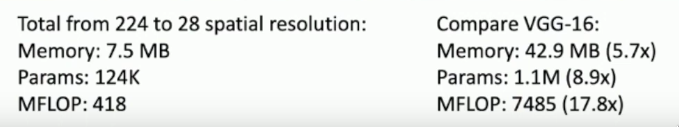

- Inception Module. 

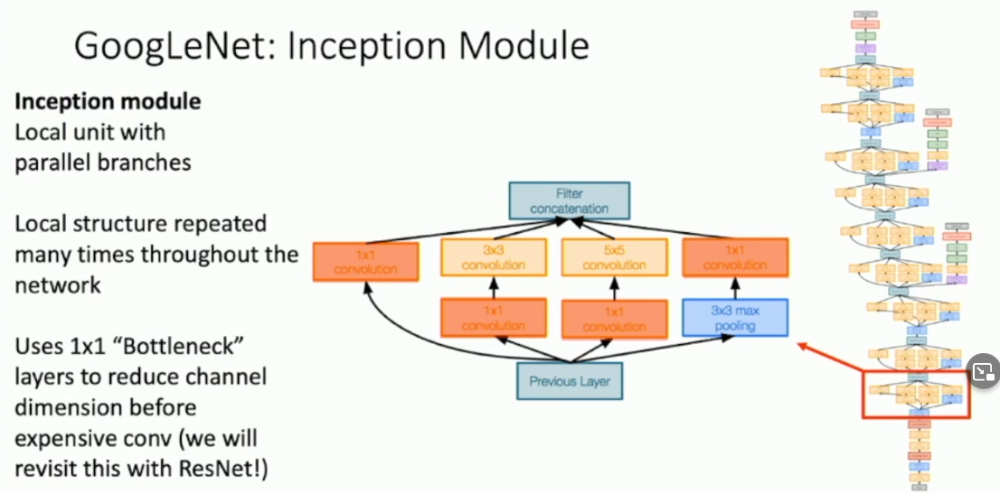

- Global Average Pooling. This is instead of fully-connected layer. And in the end only one fully-connected layer. This was repeated by others.

- Auxiliary Classifiers. It was before batch norm. This is ugly hack. 

58. 2015 year. 152 layers. With Backnorm. This is Residual Networks come (residual - остаточный).

- What happers if we add layers? Go deeper? It does worse than shallow model. 
- Is it overfitting? - they thought. But on a training error it was the same picture, it was worse. So it is not overfitting, but underfitting. Something happen with optimizaiton. THis is also suprising because a deeper model can emulate a shallower model: copy layers. They should do at least as good as shallow.
- Why? Hypothesis: it is optimization problem.
- Solution: change the network so learning identity functions with extra layers is easy. This is to avoid degradation in the case of simple models. So they can emulate shallow models when they don't need many layers.
    - Residual block:
    
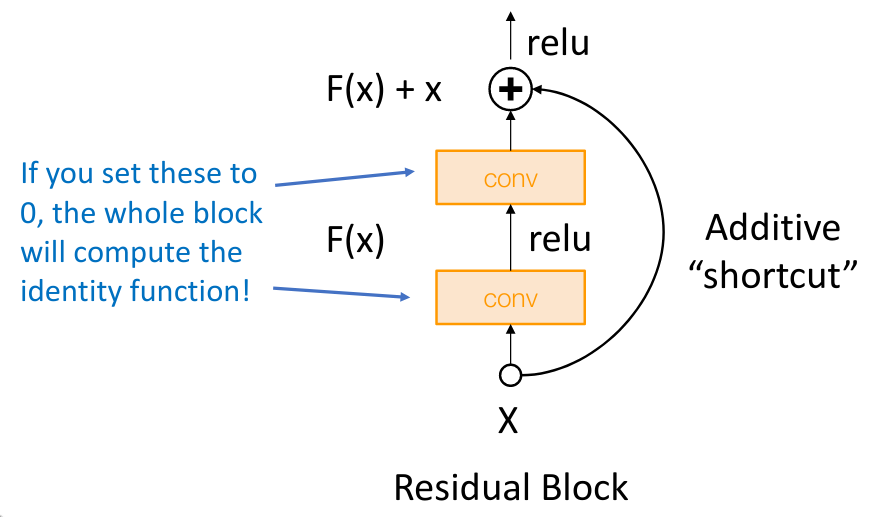

66. Residual Networks.

Is a stack of many residual blocks. It takes innovations from VGG (3x3 conv) and GoogLeNet (stemming in beggining and global avg pooling in the end). So now we only choose num of layers:

- ResNet-18. 1 conv layer, 4 stacks of 4 layers with residual blocks and conv, and linear at the end.
     - ImageNet top5 error: 10.92%

- ResNet-34. Top5 error: 8.58%

72. Residual net: diff designs of the block

- "Basic"
- "Bottleneck"

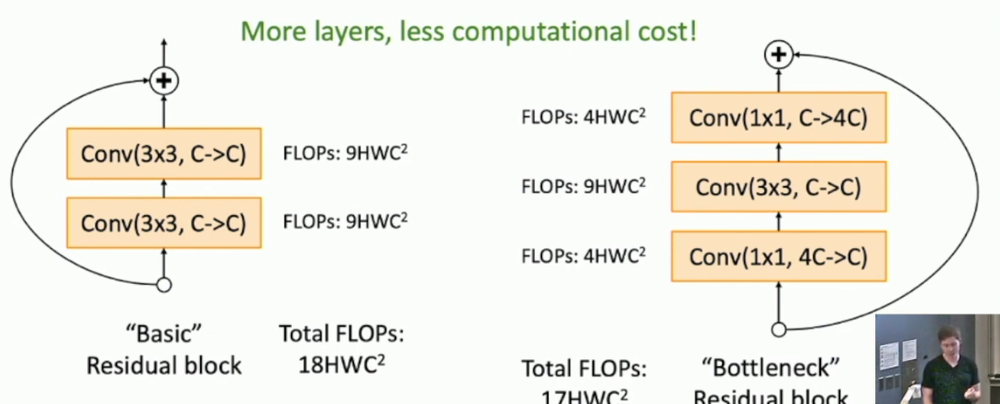

Slightly less FLOPs but more non linearity which is assumed to be better.

- ResNet-50 uses the "Bottleneck" block and do more layers but we simular num of computation. 

- Clear trend was that making it deeper it performce better.

- So in 2015 Residual Networks took all prices so it prevails now.


82. Comparing Complexity.

This picture shows that designing networks allowed to get better accuracty with less memory and compute.

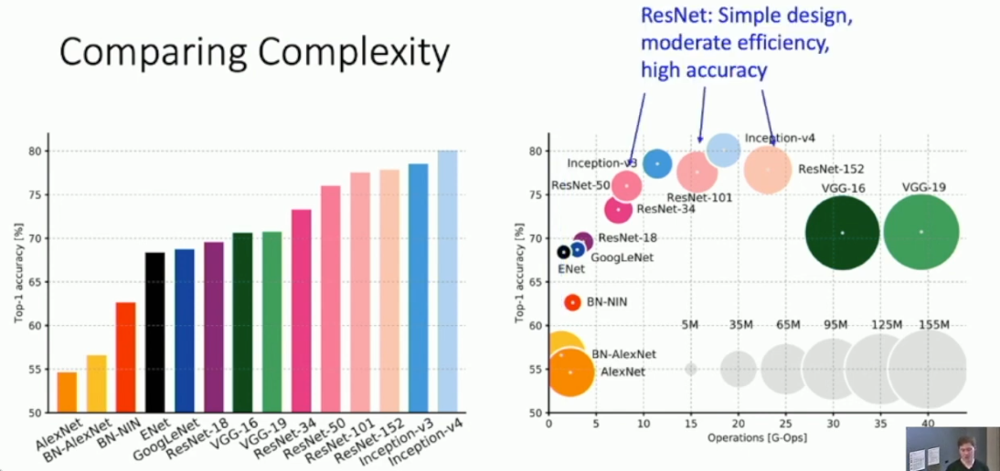

90. In 2016, ImageNet winner didn't have new ideas implemented but was an ensembles of all previous work. And did slightly better.

91. Improving ResNets: ResNeXt.

- Let's do parallel blocks. 

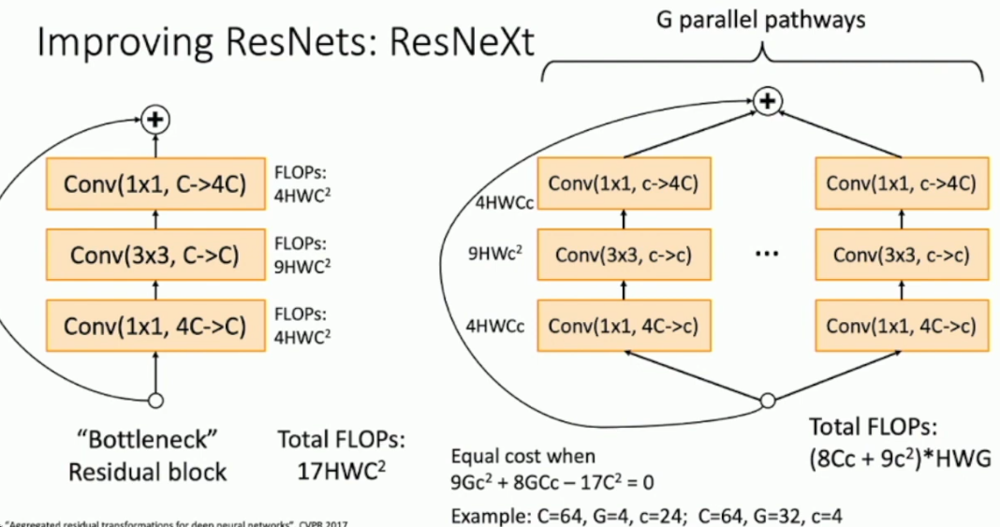

- Same computation but more parallel pathways. 
- In PyTorch - group parameter.
- And adding more of those pathways (groups) it increases accuracy but with the same amount of compute.

104. ImageNet closes on 2017 

105. Densely Connected Neural Networks

- Instead of adding previous features with later features, it concats them.

106. MobileNets.

- Aim: min computation. For mobile devices. 
- See ShuffleNet, MobileNetV2.

108. Automating designing neural arch.

- Automates this process. A controller outpus network architectures.
- But it is very expensive.
- It can be used to find efficient CNN arch. 

111. Summary.

112. What to use?
- ResNet-50 or ResNet-101. 
- Or MobileNets or ShuffleNets for mobile devices.

### Questions:

4. Problem with CNN? 
5. What's ImageNet?
7. AlexNet.
- Its parameters: num of layers, how many GPUs.
- How it was designed?
33. ZFNet, 2013. Num of layers. 
37. VGG, 2014. 
- Its principles (rules) of design.
- 3x3 stride. Why?
- Comparing VGG with AlexNet
46. GoogLeNet. 2014
- Its aim.
- Aggressive stemming. How?
- Global Average Pooling
58. 2015. Residual Networks.
- Problem with deeper networks that time?
- Hypothesis why this?
- Design of Residual block.
- What advantages it gives?
72. Types of Residual block
- Basic
- Bottleneck
91. ResNeXt. Parallel pathways. New residual block.
105. Densely Connected NN.
- Concatination
106. Mobile devices NN.
108. Automating NN architecture search.



## Lecture 9. Hardware and software

4. CNN arch - we have. How it runs?
6. Hardware
- CPU. 
- GPU. GeForce GTX. Takes more physical space.
    - Nvidia vs AMD. Inside ML it is only Nvidia because of software.
11. Historical power. GigaFLOPs per Dollar. It shows that flops per dollar for GPU. But for CPU it stays the same almost. From 2006. 
12. More CPU vs GPU. Cores for GPU - 4608! CPU - 12. Clock speed: 4.7 vs 1.77. 
13. RTX Titan. It is a minicomputer inside. 12x2 GB memory. SMs - streaming multiprocessors (simular to traditional CPU cores). 16.3 TFLOP/sec. Tensor core inside hardard itself - it does tensor multiply (for ML specifically). 
- What we give up? We lose precision. 32 floating point arithmetic. With tensor cores it is ~132 TFLOPs/sec.
- Example: matrix multiplication. It fits perfectly for GPU. 
26. Programming GPU
- CUDA - C-like code.
- No need to write CUDE. Use Nvidia API.
27. Scale up. Use more GPUs. 
28. Gooogle vs Nvidea. It is TPU - Google Tensor Processing Units. 
- It is a secret how they work. 180 TFLOPs. Can buy but can use on Google Colab. 
- Cloud TPU v2. It has 11.5 TFLOPs for hundreds of dollars. Other options.
- But u need to use TensorFlow. 
- Gaming GPU vs ML GPU. Need more memory for ML. Also the speed of memory.
34. DL Software.
- A zoo of frameworks. PyTorch (from Torch). TensorFlow (from Theano). CNTK (MS). JAX (Google). MXNet (Amazon). 
- Why DL frameworks?
    - Rapid prototyping
    - Gradients
    - Runs on GPU (TPU)
39. PyTorch.
- 1.2 version used at the course. 
- Concepts:
    - Tensor. Numpy array like. But on GPU. 
    - Autograd. Computational graphs.
    - Module. NN layer.
- 43. 
- Tensor. `torch.tensor`
- Autograd. `requires_grad=True`, `.backward()`, `torch.no_grad()`, `.grad`, `.grad.zero_()`. There are a lot of functions (sigmoid, etc.) inside. And can define new ones (`torch.autograd.Function`).

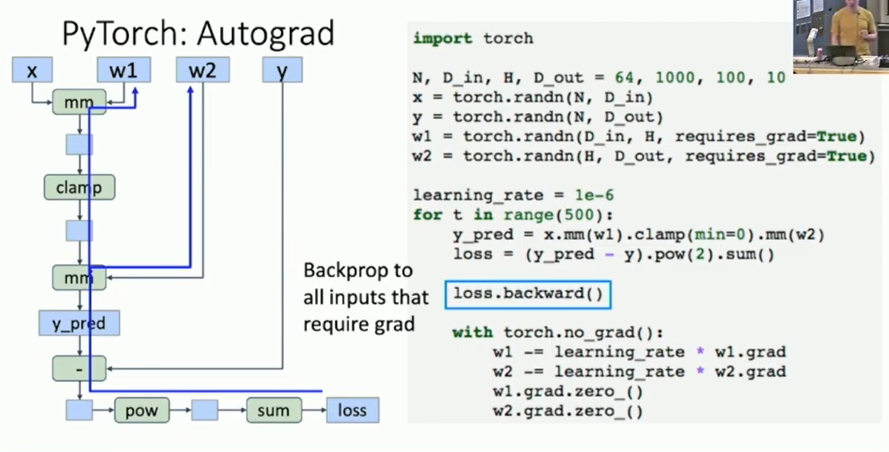

- 70. nn module. For neural networks.
- `nn.Sequential` for layers. 
- `optim.Adam` for stepping.
- 78. Custom modules for NN. `torch.nn.Module`. Can putting there our layers.  And then can use them to construct larger NN. 
- 84. DataLoaders. To load data.
- Pretrained Models. github.com\pytorch\vision
- Problem how to reuse graph?

- 93. Dynamic Comp Graphs. Optimization not to drop comp graphs. 
- Static Comp Graph. Alternative to dynamic. `torch.jit.script`. Compiles a graph. 
- Static vs Dynamic: optimization. 
- Static - can serialize and deploy. Dynamic - need code. 
- Static downside is hard to debug. 
- Dynamic Graph applications: Recurrent Networks. Recursive networks. Modular Networks.

113. TensorFlow.
- By default static graphs on 1.0 version. But on 2.0 default is dynamic graphs.
- TensorBoard - statistic for your model (also for Pytorch)

133. TensorFlow vs PyTorch.
- PyTorch:
    - clearer API
    - can't TPU
    - Not easy for mobile devices
- TensorFlow
    - Can be confusing. Api messy

### Questions

- GPU vs CPU
- What's TPU?
- Software. TensorFlow. PyTorch.
- PyTorch. How to create tensor? How to autograd? How to make NN? What's DataLoaders?
- TensorFlow. 

## Lecture 10. Training NN - 1

5. What to know before actually train NN?
- One time setup. Activation func, etc.
- Training dynamics. Optimization, scalling out / up.
- After training. Model ensembles, transfer learning.

7. Activation functions (AF)
- Act. func. are critical.
- 9. Zoo of AF

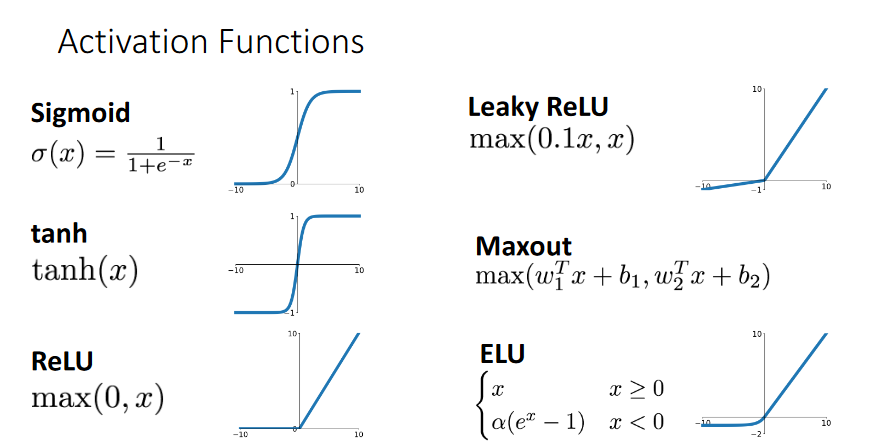

10. Sigmoid AF
- Pros: probability, firing rate of neuron.
- Cons: 
    1. Saturated neurons 'kill' gradients. Diff to train NN then. If x = -10 or 10 then close to 1 or 0. So downstream values become very low or close to 1. So no signal to other neurons. Learning dies.
    2. Outputs not zero-centered. What if input always positive? What w then? All gradients are either positive or negative. Why problem? But we want to take positive _and_ negative steps: consider if our convergence point is at bottom right for two weights w1 and w2. And it becomes worse in more dimensions, it is exponensially worse. This might work for minibatches (for single example it is problem).
    3. exp() function. It is expensive function. Not problemn for GPU. But it is for mobile devices.
    
20. Tanh.
- It is scaled and shifted sigmoid. 
- Pros:
    - zero centered
- Cons:
    - Still kills gradients
    
21. ReLU
- Pros:
    - Won't saturate
    - Computationally efficient
    - Converges much faster (up to 6 time as in AlexNet)
- Cons:
    - Not zero-centered. Less of a concern as it is faster.
    - If gradient < 0, then downstream gradience are zero. So again kills learning for that. This is called 'dead ReLU' - some examples will never activate. There is a trick to avoid dead ReLU is init weights with slightly positive biases (0.01).
    
27. Leaky ReLU.
- $ max(0.01 x , x) $
- Pros:
    - Solves cons in ReLU. 
    - Doesn't saturate. No killed neurons
    - Comp efficient
    - Converges
- Cons:
    - Extra hyperparameter.
    
28. Parametric Rectifier
- Learns they extra param from Leaky ReLU: $ max (\lambda x, x) $
- Cons:
    - The issue those ReLU are not diffirenciable at 0. Practically not important.

29. Exponential Linear Unit (ELU).
- if x > 0 then x, otherwise $ \lambda(exp(x) -1) $
- Pros:
    - All for ReLU. 
- Cons:
    - Again exp()

30. SELU 
- Rescaled ELU. That uses special scalars. Allows to train deep NN. Why? See 91 pages of math in the paper.

32. In practice
- Diff AF doesn't matter much. See diagraph. Within 1% with each other. 
- Don't stress too much. Don't use Sigmoid or tanh. Use ReLU will probably work


34. Data Preprocessing

- Idea: before feeding data we transforming it
- Data Cloud far from center. 
- For numerical: Pull to origin: mean. Scale : div by std.
- Why? The same logic as for loss func: to make gradients both neg and pos.
- For non-numeric or non-image data. 
    - Decorrelation - move to origin and rotate so that they are not correlated
    - Whitened data. First decorrelation and then apply normaliz (mean, std). 
    - See PCA and whitenend.
- Why helpful? THink about where linear classifier will be. If near origin then easier to find the classifier. If far from origin, then a little change the more classification change.

- 40. For Images. 
    - Subtract mean. AlexNet
    - Subtract per-channel mean. VGG
    - Sbutract per chan mean and div by std. ResNet.
    - When compute statistic? Only at training time. At test time, in the wild it is not computed.
    - If Batch Norm then data preproc? Should work but better explicitely.

42. Weight initialization
- If W=0 and b=0. Then it is bad because all outputs will be zero and gradients also. Problem - 'not having symmetry breaking'. 
- In practice: let's do small random num. $ W = 0.01 * np.random.randn(Din, Dout) $. Works for shallow but not for deep.
- 46. Activation Statistics for deep networks. 
    - 47. Plots for learning when random - how gradients look like. Standard deviation decreases, collapses towards zero. So no zero if deep NN. 
    - How to fix? Let's init with a larger values. From 0.01 to 0.05 scalar. Again they all in saturated regime, local gradient is zero.
    - Solution? Xavier initialization:
    
    $ W = rand (Din, Dout) / sqrt(Di) $
    
    For conv layers, Di is kernel_size^2 * input_channels. 
    Xavier assumes _zero centered_ (but ReLU is not).
    
    - How to derive? 
    
    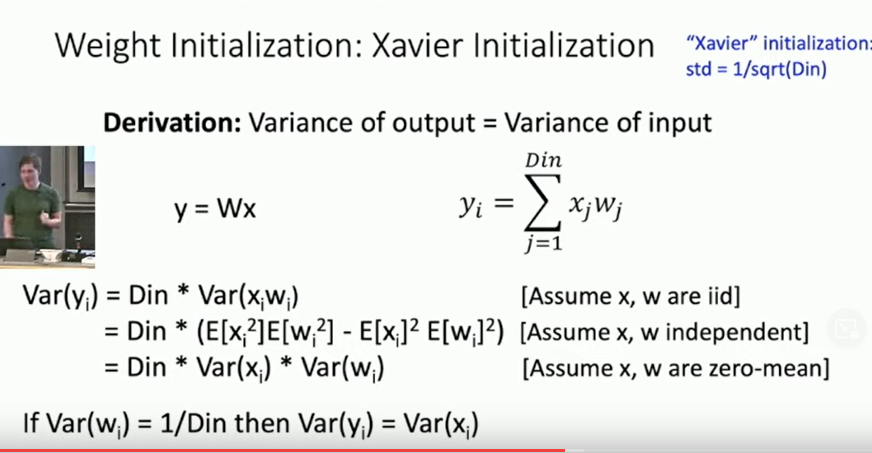

    - But we have ReLU. Then what? Plot of gradients again show that no learning. It collapsing. Need to change init. 
        Kaiming / MSRA Initialization. 
        - And MSRA could converge without batch norm.
- 63. For residual nets? Now MSRA doesn't work as gradients grow and grow and blows. 
    Solution: Do MSRA for first conv layer but for secon conv init weights to zero. Then Var(F(x) + x) = Var(x)l.
- This is active area of research. Basicaly we want to have good gradients.

66. Regularization. 
- Problem: overfitting.
- Ways: L2 regularization, L1, etc.

- 68. Dropout. Randomly set some neurons to zero. Probability - 0.5 common param. 
    - Why? It prevents co-adaptation of features or it prevents redundant representation. So diff neurons specialize. 
        - Dropout trains ensemble of NN hence many NN and the final will sum them.
    - Implementation: multiply output by mask that sets some output values to zero (0.5 probability). 
    - Problem: test time then random! Ouput is random. Consistency between deployment.
        We want to average out our randomness. 
        
        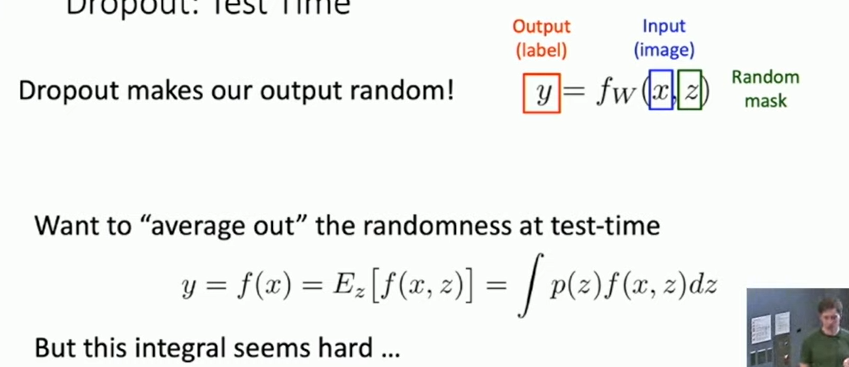
        
    - How to compu integral? No idea. Then we approximate it. Compute $ E[a] $ during training. 
    
        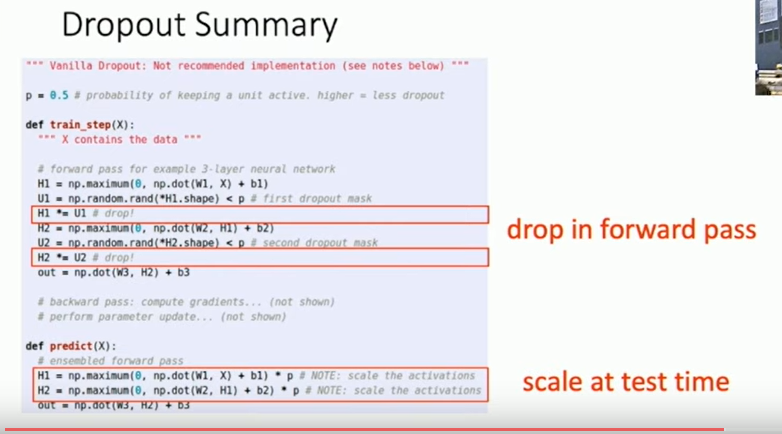
        
- Another: 'Inverted dropout'. Diff is when we do scaling at test or training time.

- 80. Where to insert Dropout? Architectures.
    - At the end. In fully-connected layers. 
    - But for later architectures (resnet, etc.) they use global average pooling instead of dropout.
- Dropout is simular to Batch Normalization as it adds randomness at training time. Output of is dependant where an output was, in what batch. So for ResNet L2 and Batch Norm replaced dropout, this is the only regularizing.


85. Data Augmentation.
- Modify data to get more data, randomness.
    - Crop
    - Scales
    - Resizing
    - Rotation
    - Translation
- This multiplies dataset, more input.
- But this depends on data. COnsider left and right hand. Human knowledge applies.

Other regularizations:

- 92. DropConnect. Drop connects. Similar to dropout but drops (zero) weights.
- 94. Fractional max Pooling. Randomize sizes of the pooling regions in conv NN. Some 1 by 1 others 3 by 3, etc. 
- 95. Stochastic Depth. Skip some residual blocks in ResNet. 
- 96. Stochastic Depth. Cutout. Cut some area from input. 
- 97. Mixup. Blend images with random blend rand. 

What to use?
- Dropout for large fully-connected layers
- Batch norm and data augment - always good idea
- Try cutout and mixup.

### Questions

5. What we need additionally know before actual training?
7. Activation functions. They pros and cons:
    10. Sigmoid
    20. Tanh
    21. ReLU
    27. Leaky ReLU
    28. Parametric Rectifier
    29. ELU. 
    30. SELU
    32. What to use in practice?
34. Data preprocessing
    - What's it? 
    - For numerical. How? Formula
    - Why works?
    40. For non-numeric, non-image. 
        Decorrelation.
        Whitened
42. Weight initialization
    - What if W=0 and b=0? 
    - How to init for shallow NN?
    - How to init for deep NN? Xavier init. 
        - How? What's problem then? (ReLU)
    - Kaiming MSRA init
66. Regularization. 
    - Ways? L1, L2.
    68. Dropout. How to implement? Why it works?
       - What's problem with dropout? How to fix it?
        80. Where to insert dropout? 
        - Do we need Dropout if we have Batch normalization and L2 regul in ResNet.
85. Data Augmentation.
    - What ways?
    - Can we always apply data augmentation?
92 Name other ways to regularize?
- What to use?
        


## Lecture 11: Training NN. Part 2

Training dynamics: learning rate, hyperparams.
After training: model ensembles, transfer learning, batch training.

13. Learning rate. 

Probably most important.

Variants:

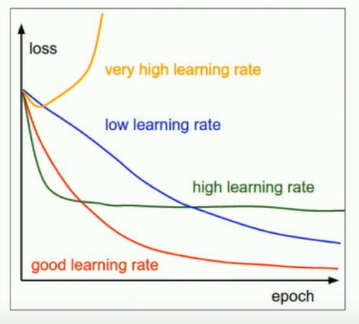

Good is quick to low loss, steadily, not exploid to infinitty.
Best? No one is the best. But change it over training. If platauing then change to lower, etc.

Learning rate schedule:

- "Step" learning rate decay. At few fixed points reduce learning rate. Then it looks like a ladder. "Step learning schedule". 
    Cons: introduces a lot of new hyperparameters. It takes a lot of trial and error. It is complex.
- "Cosine" learning rate decay. Again reduce but use cosine func: $ 1/2 * a_0 (1 + cos(t \pi / T )) $
    Popular somewhat.
    Pros: no new params. T and a_0 we have. T - num of epochs.
    Cons: it is one of many shapes.
- "Linear" rate decay. Just use linear: $ a_t = a_0 (1 - t / T ) $
- "Inverse sqrt": $ a_t = a_0 / \sqrt(t) $. Cons: spends much time in lowrates.
- "Constant": $ a_t = a_0 $ . He recommends it. Behaves reasonably well. Optimize later (to get 1-2% extra percentages).
    
Questions:
- about exploiding loss. See data for bad examples.
- Choose learning rate by hand? Can but hard. Avoid.
- Plot moving average of loss. Gives hint on long-term 


18. Early stopping.

Monitor - accuracy for train and val; and monitor loss. Always good idea. Check every 5,10, .. epoch. Stop on a point where val starts to degrade.

22. How to choose parameters?

- Grid Search. Choose several values for each. Space them in log-linearly. For each param. Evaluate all possible choices on this grid. 
- Random Search. Log-uniform on some interval. Run many diff trials. Choise the one set that works best. There is strong argument for choosing random - (Random Search for hyper-parameter optimization, 2012, paper). We got more samples?

In real world. 
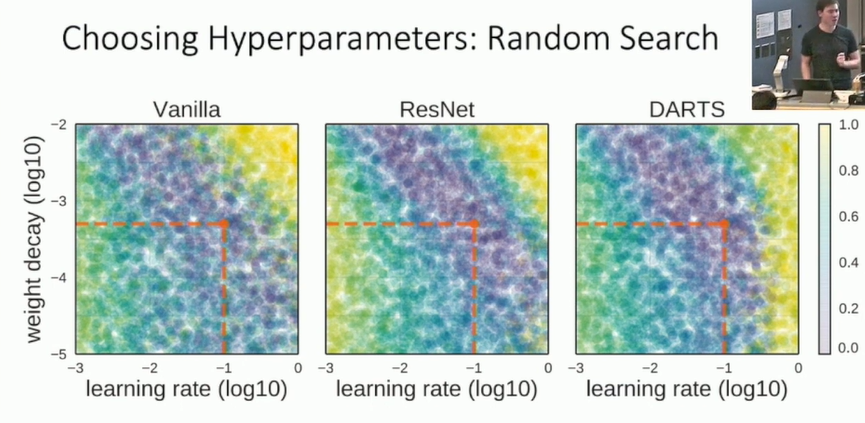
Dark purple works well other worse.

Can use Gradient Descent to find hyperparams? Yes. Active area of research. There are above and below ML models then. But not used in practice as comp is expensive.

How to choose if no tons of compute:

1. Step 1. Check init loss. Turn off weight decay. What your expected loss (analytically)? then check it. E.g. for Cross-entropy loss - -log(C)
2. Overfit small sample. Train to 100% accuracy within 5 min or so. To find out I have no bugs. Don't care about regularizaiton, etc.
3. Find learning rate that makes loss go down. Within 100 iters or so. Good: 1e-1, 1e-2, 1e-3, 1e-4. Now we see loss starts to go down.
4. Coarse hyperparams grid. For ~1-5 epochs. And check from a set of params around those you found in prev step.
5. Refine grid, train longer. Best from previous and longer train.
6. Look at learning Curves. 
7. Goto step 5. 

Situations:

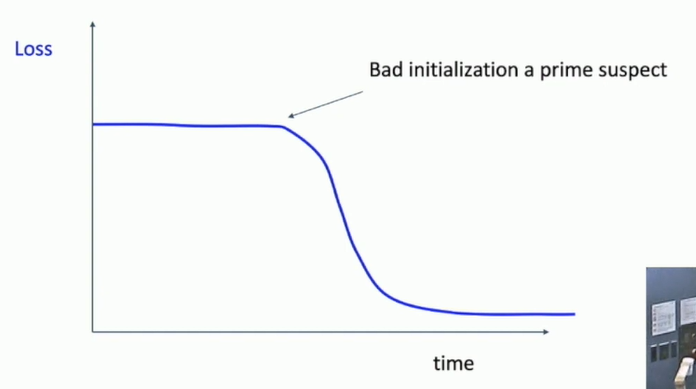
Bad init

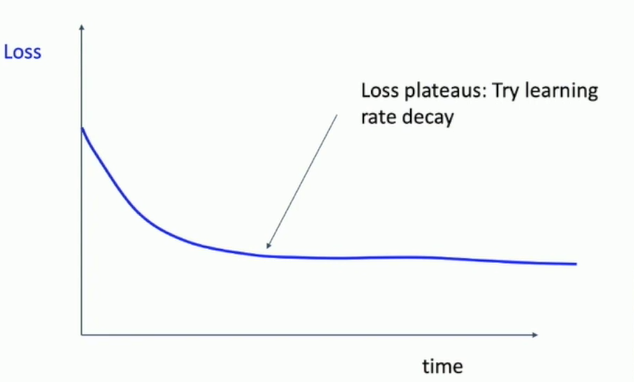

And other.. See lecture.

Also look at accuracy for train and val:

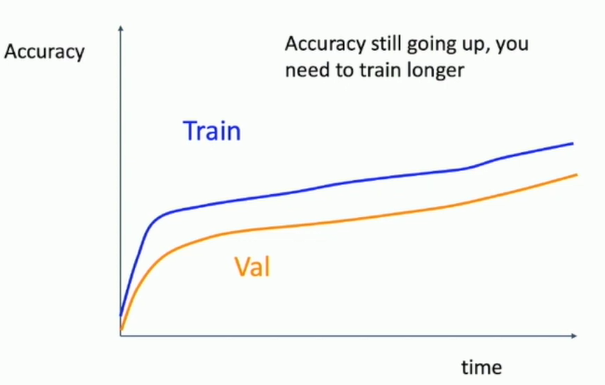
The above is good. continue to wait.

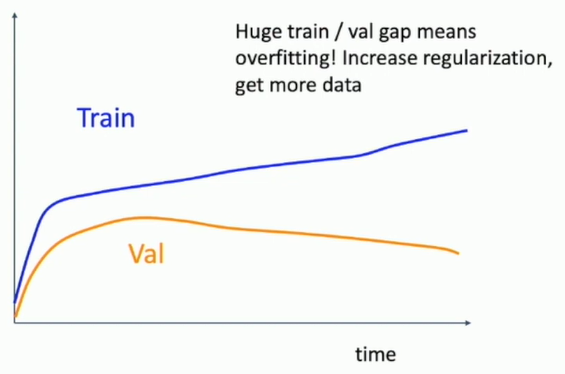
This one is bad as it overfits.

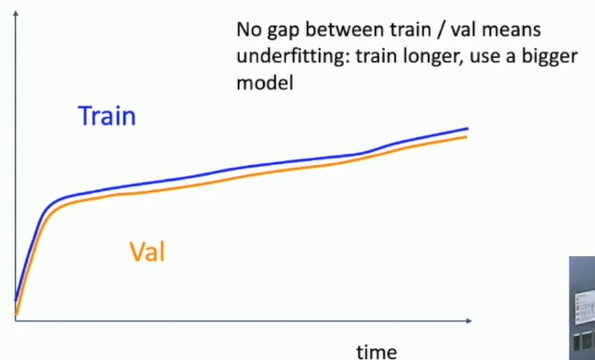
This is underfitting. Better with larger gap. 

All this looks like DJ doing music. You need "command center" for cross-validation. Use TensorBoard (should work with PyTorch).

Other things to track: ratio of weight update / weight magnitude. About 0.01 is ok.

45. After training

46. Model Ensembles. 

1. Train multiple independent models
2. Average their results. Averaging tech varies.

Tips and Tricks:
- Use multiple snapshots of a single model to get ensembles.
- Keep a moving average of the parameter vector. And then use those averages at test time:
    $ x_test = 0.995*x_test + 0.005*x $  where $ x $ is current weights.
    
49. Transfer learning. 

Need a lot of data? No, it's false. Use transfer learning.

T.l. with CNNs:

First, train on ImageNet.
Second, freeze some layers (this feature representation).

Used widely. Examples:
- Classification on Caltech-101: LogReg DeCAF6 w/ Dropout, other.  
- Bird Classification. 
- Other image classifications. They first pretrained on ImageNet and then used it for new dataset.
- For image retrieval (find similar picture). Using nearest-neighbour on top of transfer learning. 

- 58. Find-Tuning. For large datasets. Take pre-trained model (example is on imagenet), throw the last layer and reinit this last layer and continue training all model for a new dataset.
    - Gives good results. 
    
- 61. Architecture matters. Good is ImageNet, many researches use it.
    - Works good on ImageNet then better on other datasets.
    
- 64. How to approach transfer learning with CNN

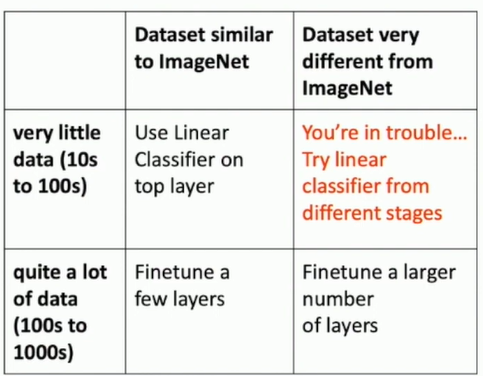

Transfer learning is a norm not exception. 

Also some research transfer from more than one datasets.

Cons of transfer learnings:
- Can do well without transfer on some datasets.
- Can do better without transfer. 


74. Distributed Training. 

Using many GPUs. Splitting model along diff GPUs.
- Bad split model vertically. They will wait.
- Better horizontaccly. Bad also as need to sync.
- Better use batches of N images with separate models. At end of each pass: exchange grads, etc. Can split on hundreds of GPUs. Even can do splitting on diff data centers.
- Large-Batch Training. Scaling Learning rates linearly through those GPUS.
    - Learning Rate Warmup.


#### Questions:

13. Learning rate.
- What's good learning rate?
- What learning rate decay to use?
18. Early stopping. 
- What to monitor?
22. How to choose parameters? What's the best method?
- Algorithm to find better params if no tons of compute?
45. Model ensembles.
49. Transfer learning
- Variants.
- Fine-Tuning
74. Distributed Training. How to train on many GPUs?

CONTINUED IN NOTES